In [ ]:
#########################################
# 1. IMPORT LIBRARIES & SET GLOBAL VARS #
#########################################

import os
from os.path import exists
import glob
import re
import sys
sys.path.append('../')


import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from PIL import Image
import xarray as xr

import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
import torchvision.models as models

import gdown

# Threshold used for selecting reliable voxels.
NCSNR_THRESHOLD = 0.2


from PIL import Image

from sklearn.manifold import MDS
from sklearn.decomposition import PCA


import sys

import pickle

In [3]:
# Load Algonauts data

with open('../algonauts_brain_data_joint_images_8subjects.pkl', 'rb') as f:
    brainData = pickle.load(f)

shared_images = np.load('../algonauts_joint_images_8subjects.npy')
clean_images = shared_images

In [10]:
avail_models = models.list_models(module=torchvision.models)
avail_models

['alexnet',
 'convnext_base',
 'convnext_large',
 'convnext_small',
 'convnext_tiny',
 'densenet121',
 'densenet161',
 'densenet169',
 'densenet201',
 'efficientnet_b0',
 'efficientnet_b1',
 'efficientnet_b2',
 'efficientnet_b3',
 'efficientnet_b4',
 'efficientnet_b5',
 'efficientnet_b6',
 'efficientnet_b7',
 'efficientnet_v2_l',
 'efficientnet_v2_m',
 'efficientnet_v2_s',
 'googlenet',
 'inception_v3',
 'maxvit_t',
 'mnasnet0_5',
 'mnasnet0_75',
 'mnasnet1_0',
 'mnasnet1_3',
 'mobilenet_v2',
 'mobilenet_v3_large',
 'mobilenet_v3_small',
 'regnet_x_16gf',
 'regnet_x_1_6gf',
 'regnet_x_32gf',
 'regnet_x_3_2gf',
 'regnet_x_400mf',
 'regnet_x_800mf',
 'regnet_x_8gf',
 'regnet_y_128gf',
 'regnet_y_16gf',
 'regnet_y_1_6gf',
 'regnet_y_32gf',
 'regnet_y_3_2gf',
 'regnet_y_400mf',
 'regnet_y_800mf',
 'regnet_y_8gf',
 'resnet101',
 'resnet152',
 'resnet18',
 'resnet34',
 'resnet50',
 'resnext101_32x8d',
 'resnext101_64x4d',
 'resnext50_32x4d',
 'shufflenet_v2_x0_5',
 'shufflenet_v2_x1_0',
 'sh

In [ ]:
# 1000 Imagenet images, one from each category

fnames = [f for f in os.listdir('/mnt/ceph/users/sharvey/decoding/imagenet-sample-images/dataset/test/') if not f.startswith(".")]

images = []
for ind in range(len(fnames)):
    image_path = '/mnt/ceph/users/sharvey/decoding/imagenet-sample-images/dataset/test/' + fnames[ind]
    try:
        img = Image.open(image_path)
        img_array = np.array(img)
        images.append(img_array)
    except Exception as e:
        print(f"Error loading image {image_file}: {e}")

shared_images = images


bwimageidx = []
for i, num in enumerate([len(shared_images[i].shape) for i in range(len(shared_images))]):
    if num < 3:
        bwimageidx.append(i)
        shared_images[i] = np.repeat(shared_images[i][:, :, np.newaxis], 3, axis=2)
        

In [ ]:
# Extract representations resulting from probe inputs image_data for a list of models, and save them individually (takes a long time)

import extract_internal_reps

# internal_reps = []
# model_2nds = []
repDict = {}

model_names = ['resnet50']
weights = 'first'
# image_data = test_image_data[0:1000,:,:,:]
# clean_images = shared_images
batch_size = 32
perm = 0

# permutation = np.array([1, 2, 0])

# if not np.array_equal(np.sort(permutation), np.arange(3)):
#     raise ValueError(f"Permutation array must contain all unique indices from 0 to 2.")

if perm:
    image_data = []
    for i in range(len(shared_images)):
        # permutation = np.random.permutation(3)
        single_image = shared_images[i]
        single_image_perm = single_image[...,permutation[i]]
        image_data.append(single_image_perm)
    # image_data = np.array(image_data)
else:
    image_data = shared_images

for model in model_names:  #avail_models:
    repDict[model] = extract_internal_reps.get_model_activations(model, weights, image_data, batch_size=32, saverep = True, filename = 'algonauts_shared_images_colors_normal')
    print(model + " done")

In [6]:
# Load some saved representations

repDict_cnormal = {}

model_names = ["resnet50", 'vit_b_16', 'dinov2_vitb14']

N_models = len(model_names)
for model_name in model_names:
    with open('../reps/' + model_name + '_algonauts_shared_images_colors_normal.pkl', 'rb') as f:
        new_reps = pickle.load(f)
        repDict_cnormal.update(new_reps)
        print(model_name)

# model_names, _ = zip(*repDict.items())
model_names = [value for value in repDict_cnormal.keys()]
# internal_reps = [value[0] for value in repDict.values()]


resnet50
vit_b_16
dinov2_vitb14


In [ ]:
layer_names = []
internal_reps = []
layer_models = []

for model_name in model_names:
    layer_names.extend([value for value in repDict_cnormal[model_name].keys()])
    internal_reps.extend([value for value in repDict_cnormal[model_name].values()])
    layer_models.extend([model_name] * len([value for value in repDict_cnormal[model_name].keys()]))


In [6]:
# Make sure representations are flattened

internal_reps = [internal_reps[i].reshape((internal_reps[i].shape[0], np.prod(list(internal_reps[i].shape[1:])) )) for i in range(len(internal_reps))]

internal_reps = [internal_rep/np.linalg.norm(internal_rep, ord=2) for internal_rep in internal_reps]

[internal_rep.shape for internal_rep in internal_reps]


[(872, 150528),
 (872, 802816),
 (872, 802816),
 (872, 802816),
 (872, 200704),
 (872, 802816),
 (872, 401408),
 (872, 200704),
 (872, 100352),
 (872, 2048),
 (872, 1000),
 (872, 150528),
 (872, 150528),
 (872, 151296),
 (872, 151296),
 (872, 151296),
 (872, 151296),
 (872, 151296),
 (872, 151296),
 (872, 151296),
 (872, 151296),
 (872, 151296),
 (872, 151296),
 (872, 151296),
 (872, 151296),
 (872, 151296),
 (872, 1000),
 (872, 150528),
 (872, 196608),
 (872, 197376),
 (872, 197376),
 (872, 197376),
 (872, 197376),
 (872, 197376),
 (872, 197376),
 (872, 197376),
 (872, 197376),
 (872, 197376),
 (872, 197376),
 (872, 197376),
 (872, 197376),
 (872, 197376),
 (872, 768)]

In [9]:
import pickle

with open('../cached_matrices/internal_reps_cache_resnet50_vit_b_16_DINOv2_vitb14_algonauts_shared_a0b1_all_layers_colors_normal_opnorm.pkl', 'wb') as fp:
    pickle.dump(internal_reps, fp)

In [11]:
import pickle

with open ('../cached_matrices/internal_reps_cache_resnet50_vit_b_16_DINOv2_vitb14_algonauts_shared_a0b1_all_layers_colors_normal_opnorm.pkl', 'rb') as fp:
    internal_reps = pickle.load(fp)

In [10]:
import metrics 

dd = metrics.LinearDecodingSimilarityMulti(center_columns=True, a = 0, b = 1, whiten = False, alpha = 0.5)
cached = dd.cache(internal_reps, returnGinv=False) # this part takes a long time
# cached = dd.cache(reps_pcs, returnGinv=False) # this part takes a long time
np.savez('../cached_matrices/Kx_cache_resnet50_vit_b_16_DINOv2_vitb14_algonauts_shared_a0b1_all_layers_colors_normal_opnorm.npz', cached, layer_names)




0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
Done caching.


In [12]:
# load previously computed cache

loaded_cache = np.load('../cached_matrices/Kx_cache_resnet50_vit_b_16_DINOv2_vitb14_algonauts_shared_a0b1_all_layers_colors_normal_opnorm.npz')

# cached = loaded_cache
cached = loaded_cache["arr_0"]
layer_names = loaded_cache["arr_1"]
layer_names = [str(layer_name) for layer_name in layer_names]

In [13]:
layer_names

['pixels',
 'conv1',
 'bn1',
 'relu',
 'maxpool',
 'layer1',
 'layer2',
 'layer3',
 'layer4',
 'avgpool',
 'fc',
 'pixels',
 'conv_proj',
 'encoder_layer_0',
 'encoder_layer_1',
 'encoder_layer_2',
 'encoder_layer_3',
 'encoder_layer_4',
 'encoder_layer_5',
 'encoder_layer_6',
 'encoder_layer_7',
 'encoder_layer_8',
 'encoder_layer_9',
 'encoder_layer_10',
 'encoder_layer_11',
 'encoder',
 'heads',
 'pixels',
 'patch_embed',
 'block.0',
 'block.1',
 'block.2',
 'block.3',
 'block.4',
 'block.5',
 'block.6',
 'block.7',
 'block.8',
 'block.9',
 'block.10',
 'block.11',
 'norm',
 'head']

In [216]:
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

def getImage(path, zoom=1):
    return OffsetImage(plt.imread(path), zoom=zoom)

# images = [test_image_data[i,:,:,:] for i in range(1000)]
images = [shared_images[i] for i in range(len(shared_images))]

# metric_type = 'similarity'
metric_type = 'distance'
plot = 'False'
p = 5 # dimension of the projection

# inds = list(range(0,17))
# inds = list(range(17,33))
# inds = list(range(34,49))

inds = list(range(0, len(layer_names)))

dist_mat = np.zeros((len(inds),len(inds)))

dist_task_dict = {}

count1 = 0


for ind1 in inds:
    count2 = 0
    KX = cached[ind1]
    
    for ind2 in inds:
        
        KY = cached[ind2]
        
        if metric_type == 'similarity':
            A = (1/2)*(KX@KY + KY@KX)
        elif metric_type == 'distance':
            A = (KX - KY)@(KX - KY)
        else:
            print('check metric type')
        
        vals, vecs = np.linalg.eig(A)
        
        idx = vals.argsort()[::-1]   
        vals = vals[idx]
        vecs = vecs[:,idx]

        Xw = KX@vecs[:,0:p]
        Yv = KY@vecs[:,0:p]

        if metric_type == 'similarity':
            # dist_mat[count1,count2] = (Xw.T @ Yv) /(np.linalg.norm(Xw) * np.linalg.norm(Yv))
            dist_mat[count1,count2] = np.trace((Xw.T @ Yv)) /(np.linalg.norm(Xw, ord='fro') * np.linalg.norm(Yv, ord='fro'))

        elif metric_type == 'distance':
            dist_mat[count1,count2] = np.linalg.norm(Xw/np.linalg.norm(Xw, ord='fro') - Yv/np.linalg.norm(Yv, ord='fro') , ord='fro' )     #vecs[:,0].T @ A @ vecs[:,0]

        dist_task_dict[(layer_names[ind1], layer_names[ind2])] = {
            'dist': dist_mat[count1,count2],
            'vec': vecs[:,0],
            'vals': vals,
            'KX': KX,
            'KY': KY}

        

        print(layer_names[ind1])
        print(layer_names[ind2])
        
        count2 += 1

        # Plotting

        if plot == 'True':

            x = KX@vecs[:,0]/np.linalg.norm(KX@vecs[:,0])
            y = KY@vecs[:,0]/np.linalg.norm(KY@vecs[:,0])

            # x = vecs[:,0]
            # y = vecs[:,1]

            # x = KX@Cz_1
            # y = KY@Cz_1

            fig, ax = plt.subplots(figsize=(15,15))
            ax.scatter(x, y) 
            # ax.set_xlim(-0.3, 0.6)
            # ax.set_ylim(-0.25, 0.75)

            axes = plt.gca()
            x_min, x_max = axes.get_xlim()
            y_min, y_max = axes.get_ylim()

            # Determine the range for the unity line to cover the visible area
            # Ensure the line extends across the relevant portion of the plot
            unity_line_min = max(x_min, y_min)
            unity_line_max = min(x_max, y_max)

            # Create x and y values for the unity line
            unity_x = np.linspace(unity_line_min, unity_line_max, 2)
            unity_y = unity_x

            # Plot the unity line
            ax.plot(unity_x, unity_y, color='red', linestyle='--', label='Unity Line (y=x)')


            zoom=0.04

            for x0, y0, imgdata in zip(x, y,images):
                img = OffsetImage(imgdata, zoom=zoom)
                # img = Image.fromarray(imgdata, 'RGB')
                ab = AnnotationBbox(img, (x0, y0), frameon=False)
                ax.add_artist(ab)

            plt.savefig('../layer_comparison_images/zxzy_' + metric_type + '_a0b1_' + layer_models[ind1] + '_' + layer_names[ind1] + '_' + layer_models[ind2] + '_' + layer_names[ind2] + '_algonauts_shared_images.pdf', dpi=500)

            plt.close(fig)

#  --- IGNORE ---   <--- This is a comment
    # error_mat[count1] = np.linalg.norm(KX@vecs[:,0] - vecs[:,0])
    # error_mat_color[count1] = np.linalg.norm(KX@C@vecs_c[:,0] - C@vecs_c[:,0])

        
    count1 += 1

dist_task_dict['dist_mat'] = dist_mat

# Save the distance task dictionary to a file
with open('../layer_comparison_images/Resnet50_vit_b_16_DINOv2_vitb14_layer_by_layer_task_dict_' + metric_type + '_a0b1_' + 'algonauts_shared_images_p'+ str(p) +'.pkl', 'wb') as f:
    pickle.dump(dist_task_dict, f)

/tmp/ipykernel_489574/4223611922.py:54: ComplexWarning:

Casting complex values to real discards the imaginary part



pixels
pixels
pixels
conv1
pixels
bn1
pixels
relu
pixels
maxpool
pixels
layer1
pixels
layer2
pixels
layer3
pixels
layer4
pixels
avgpool
pixels
fc
pixels
pixels
pixels
conv_proj
pixels
encoder_layer_0
pixels
encoder_layer_1
pixels
encoder_layer_2
pixels
encoder_layer_3
pixels
encoder_layer_4
pixels
encoder_layer_5
pixels
encoder_layer_6
pixels
encoder_layer_7
pixels
encoder_layer_8
pixels
encoder_layer_9
pixels
encoder_layer_10
pixels
encoder_layer_11
pixels
encoder
pixels
heads
pixels
pixels
pixels
patch_embed
pixels
block.0
pixels
block.1
pixels
block.2
pixels
block.3
pixels
block.4
pixels
block.5
pixels
block.6
pixels
block.7
pixels
block.8
pixels
block.9
pixels
block.10
pixels
block.11
pixels
norm
pixels
head
conv1
pixels
conv1
conv1
conv1
bn1
conv1
relu
conv1
maxpool
conv1
layer1
conv1
layer2
conv1
layer3
conv1
layer4
conv1
avgpool
conv1
fc
conv1
pixels
conv1
conv_proj
conv1
encoder_layer_0
conv1
encoder_layer_1
conv1
encoder_layer_2
conv1
encoder_layer_3
conv1
encoder_layer_4
conv

In [7]:
with open('../layer_comparison_images/Resnet50_Dinov2_layer_by_layer_task_dict_similarity_a0b1_' + 'algonauts_shared_images_p5.pkl', 'rb') as f:
    dist_task_dict = pickle.load(f)


In [224]:
model_names

['resnet50', 'vit_b_16', 'dinov2_vitb14']

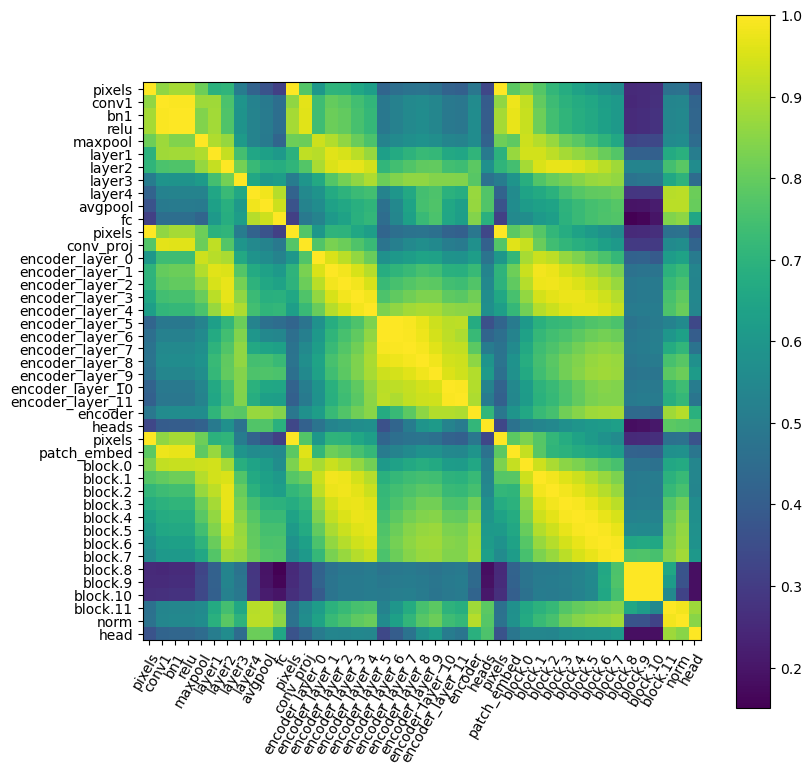

In [232]:
# Create the heatmap
fig, ax = plt.subplots(figsize= (9,9))
im = ax.imshow(dist_mat)

# Define custom tick locations and labels
x_ticks = np.arange(dist_mat.shape[0])
x_labels = layer_names # Custom labels

y_ticks = np.arange(dist_mat.shape[1])
y_labels = layer_names

# Set x-axis ticks and labels
ax.set_xticks(x_ticks)
# ax.set_xticks([])
ax.set_xticklabels(x_labels)

# Set y-axis ticks and labels
ax.set_yticks(y_ticks)
# ax.set_yticks([])
ax.set_yticklabels(y_labels)

# Add a colorbar
cbar = ax.figure.colorbar(im, ax=ax)

# Rotate the tick labels and set their alignment
plt.setp(ax.get_xticklabels(), rotation=60, ha="right",
         rotation_mode="anchor")

plt.savefig('../maxmin_image_tiles/max_similarity_matrix_' + model_names[0] + '_' + model_names[1] + '_' + model_names[2] + '.pdf')


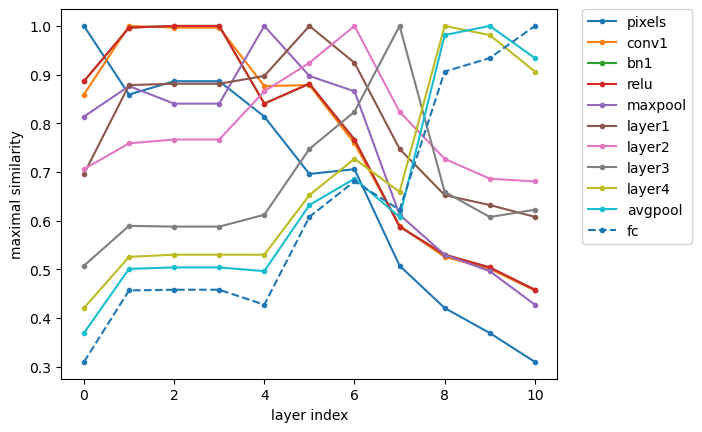

In [227]:
# for i in range(0,len(dist_mat)):
for i in range(0,11):

    # if i ==0:
    #     continue
    if i > 9:
        plt.plot(dist_mat[i,:11],'.--',label=layer_names[i])
    else:
        plt.plot(dist_mat[i,:11],'.-',label=layer_names[i])

    # plt.plot(dist_mat[i,:],'.-',label=layer_names[i])
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.0)
    plt.xlabel('layer index')
    plt.ylabel('maximal similarity')

    # plt.savefig('../layer_comparison_images/DINOv2_layer_by_layer_' + metric_type + '_a0b1_algonauts_shared_images.pdf', dpi=500, bbox_inches='tight')
    
    # plt.yscale('log')

### Inspect 2 layers

In [14]:
ind1 = 8 #2 #13
ind2 = -1 #43 #35 #20 #30

# metric_type = 'similarity'
metric_type = 'distance'
# task = 'random'
task = 'max'

KX = cached[ind1]
KY = cached[ind2]

# KX = cached[ind1]/np.linalg.norm(cached[ind1], ord='fro')
# KY = cached[ind2]/np.linalg.norm(cached[ind2], ord='fro')

if metric_type == 'similarity':
    A = (1/2)*(KX@KY + KY@KX)
    # A = (1/2)*(C.T @ KX@KY @ C + C.T @ KY@KX @ C)
elif metric_type == 'distance':
    # A = C.T @ (KX - KY)@(KX - KY) @ C
    A = (KX - KY)@(KX - KY)
else:
    print('check metric type')

# A = (1/2)*(KY@KY - KY + KX - KX@KY)@(KY@KY - KY + KX - KY@KX)

if task == 'random':
    z = np.random.rand(KX.shape[0],2)
    vecs = z
else:
    vals, vecs = np.linalg.eig(A)

    idx = vals.argsort()[::-1]   
    vals = vals[idx]
    vecs = vecs[:,idx]

print(layer_names[ind1])
print(layer_names[ind2])

print(vecs[:,0].T @ A @ vecs[:,0])

layer4
head
9.878286e-07


In [15]:
np.linalg.norm(KX@vecs[:,0] - KY@vecs[:,0])

np.float32(0.0009938957)

In [16]:
np.linalg.norm(KX@vecs[:,0] )

np.float32(4.925573e-05)

In [17]:
np.linalg.norm(KY@vecs[:,0] )

np.float32(0.0010377548)

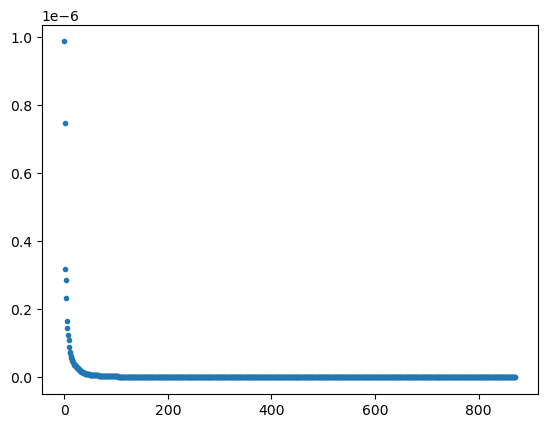

In [18]:
plt.plot(vals,'.')

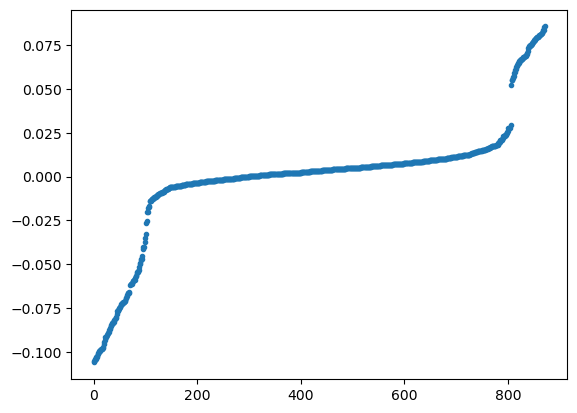

In [19]:
# Pick an eigenvector z

zind = 0

sorted_img_idx = vecs[:,zind].argsort()[::-1]
plt.plot(np.sort(vecs[:,zind]),'.')

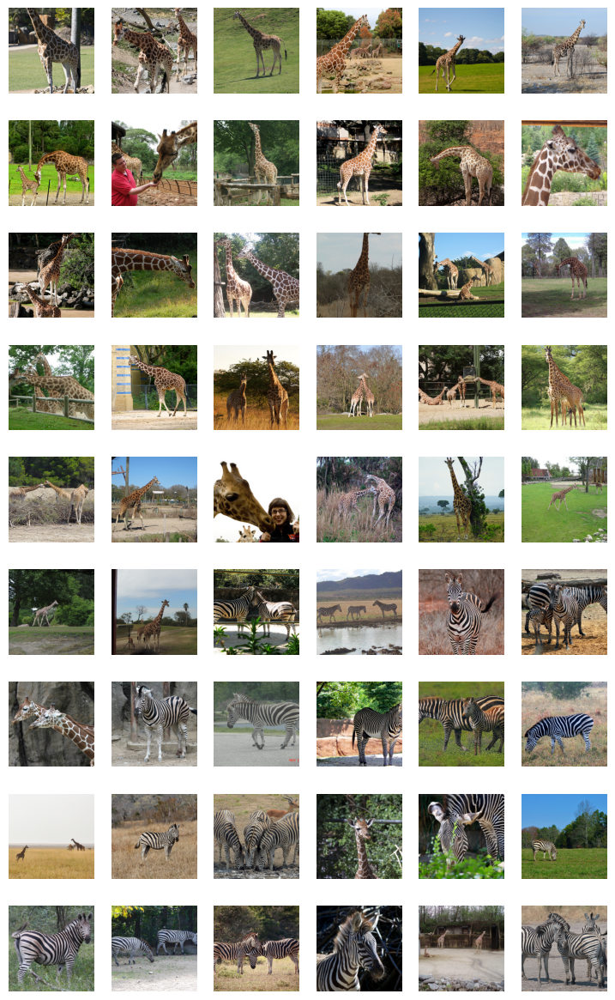

In [20]:
import matplotlib.pyplot as plt

nimgs = 54
ncols = 6
nrows = int(np.ceil(nimgs/ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(9,15))
ind = 0

for row in range(nrows):
    for column in range(ncols):
        if ind == nimgs:
            break
        else:
            # image = test_image_data[sorted_img_idx[ind],:,:,:]
            image = shared_images[sorted_img_idx[ind]]
            ax = axes[row, column]
            # ax.set_title(f"Image ({row}, {column})")
            ax.axis('off')
            ax.imshow(image)
            ind += 1

# plt.savefig('../maxmin_image_tiles/similarity_maxweights_' + model_names[0] + '_' + model_names[1] + '_eigvec' + str(zind) + '.pdf')

plt.show()



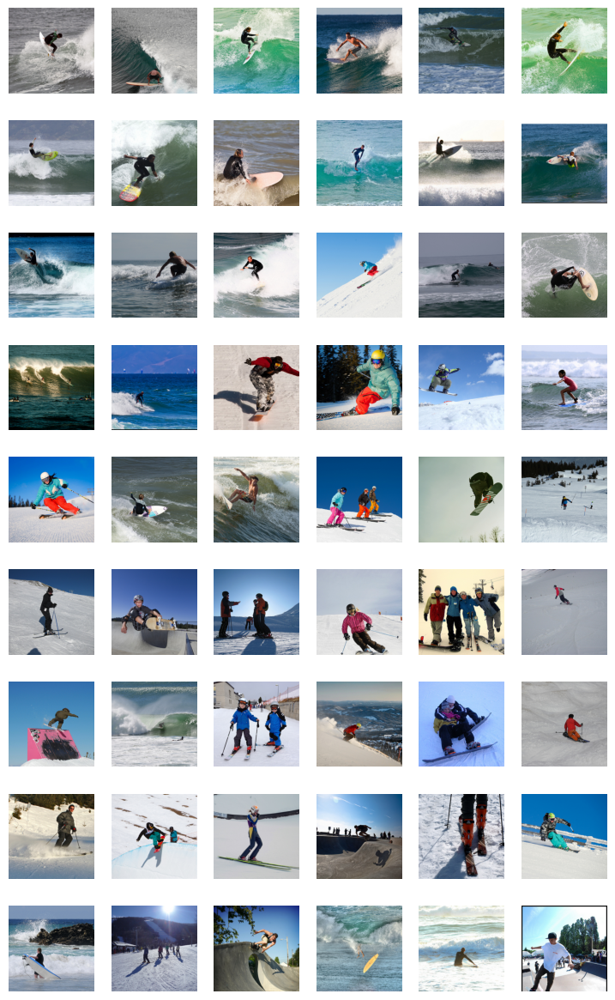

In [21]:
import matplotlib.pyplot as plt

nimgs = 54
ncols = 6
nrows = int(np.ceil(nimgs/ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(9,15))
ind = -1

for row in range(nrows):
    for column in range(ncols):
        if ind == nimgs:
            break
        else:
            # image = test_image_data[sorted_img_idx[ind],:,:,:]
            image = shared_images[sorted_img_idx[ind]]
            ax = axes[row, column]
            # ax.set_title(f"Image ({row}, {column})")
            ax.axis('off')
            ax.imshow(image)
            ind -= 1

# plt.savefig('../maxmin_image_tiles/similarity_minweights_' + model_names[0] + '_' + model_names[2] + '_eigvec' + str(zind) + '.pdf')

plt.show()

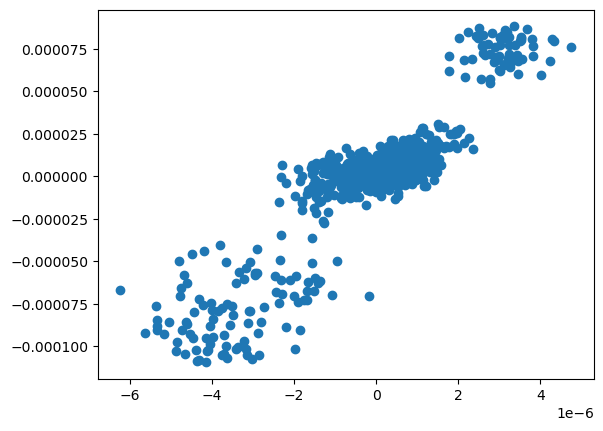

In [22]:
plt.scatter(KX@vecs[:,0], KY@vecs[:,0])

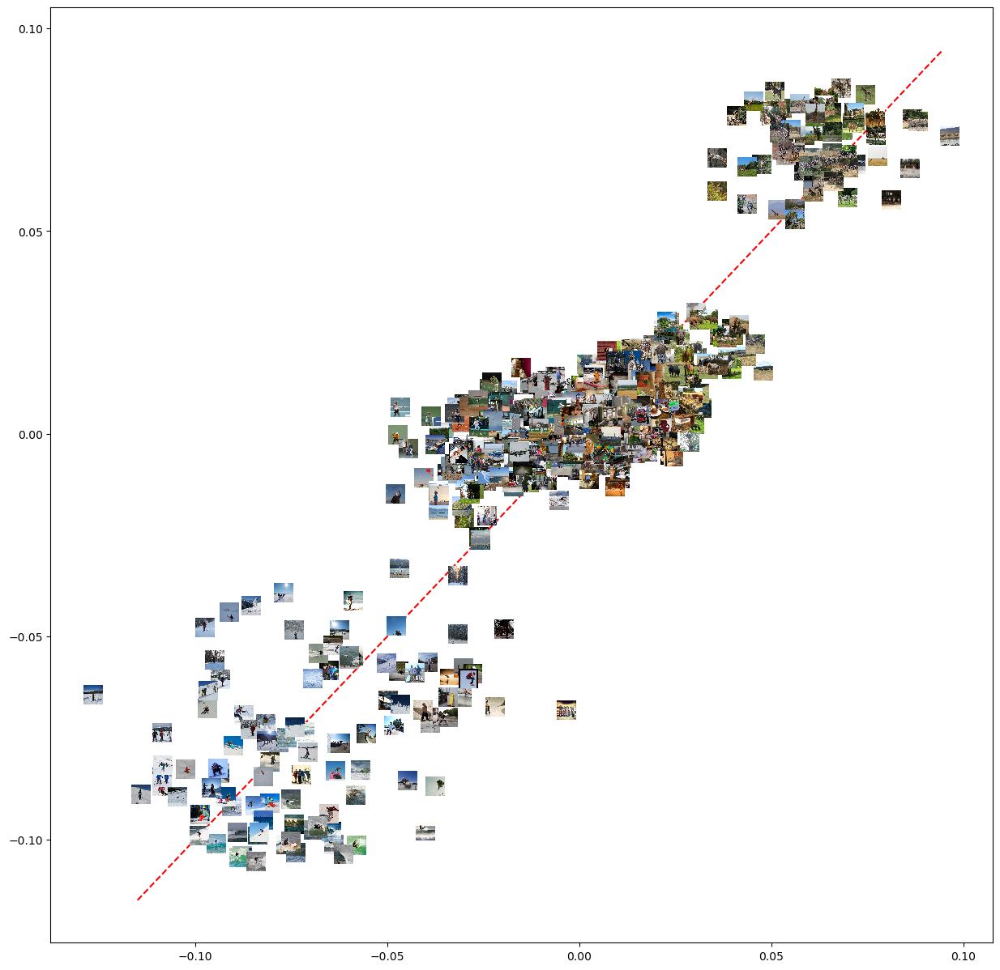

In [26]:
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

def getImage(path, zoom=1):
    return OffsetImage(plt.imread(path), zoom=zoom)



# images = [test_image_data[i,:,:,:] for i in range(1000)]
images = [shared_images[i] for i in range(len(shared_images))]

vecind = 0

x = KX@vecs[:,vecind]/np.linalg.norm(KX@vecs[:,vecind])
y = KY@vecs[:,vecind]/np.linalg.norm(KY@vecs[:,vecind])

# x = KX@vecs[:,vecind]
# y = KY@vecs[:,vecind]

# x = vecs[:,0]
# y = vecs[:,1]

# x = KX@Cz_1
# y = KY@Cz_1

fig, ax = plt.subplots(figsize=(15,15))
ax.scatter(x, y) 
# ax.set_xlim(-0.3, 0.6)
# ax.set_ylim(-0.25, 0.75)

axes = plt.gca()
x_min, x_max = axes.get_xlim()
y_min, y_max = axes.get_ylim()

# Determine the range for the unity line to cover the visible area
# Ensure the line extends across the relevant portion of the plot
unity_line_min = max(x_min, y_min)
unity_line_max = min(x_max, y_max)

# Create x and y values for the unity line
unity_x = np.linspace(unity_line_min, unity_line_max, 2)
unity_y = unity_x

# Plot the unity line
plt.plot(unity_x, unity_y, color='red', linestyle='--', label='Unity Line (y=x)')


zoom=0.04

for x0, y0, imgdata in zip(x, y,images):
    img = OffsetImage(imgdata, zoom=zoom)
    # img = Image.fromarray(imgdata, 'RGB')
    ab = AnnotationBbox(img, (x0, y0), frameon=False)
    ax.add_artist(ab)
# 
# plt.savefig('../maxmin_image_tiles/zxzy2_'+ metric_type +'_' + task + '_a0b1_'+ model_names[0] + '_' + layer_names[ind1] + '_' + model_names[2] + '_' + layer_names[ind2] + '_algonauts_shared_images_1.pdf', dpi=500)
# 
    

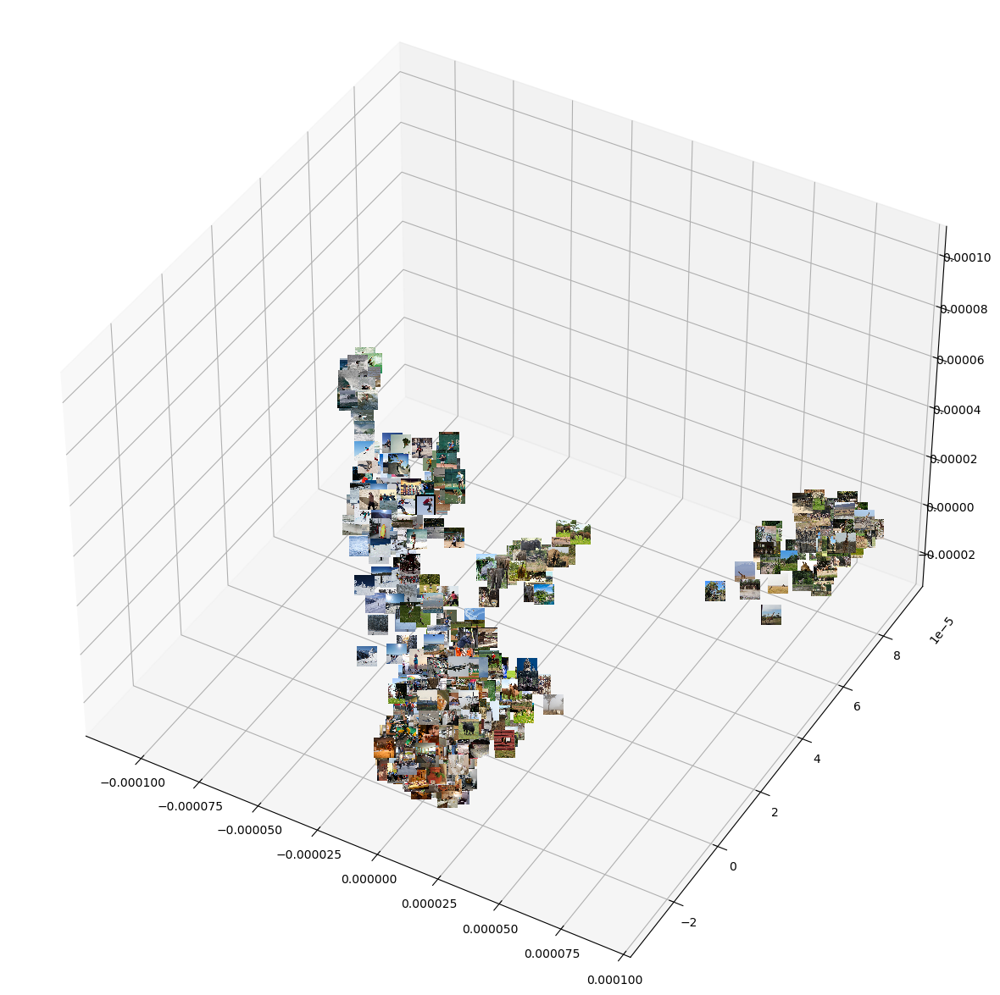

In [32]:
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from mpl_toolkits.mplot3d import Axes3D  # Needed to create 3D axes
import numpy as np

from matplotlib.animation import FuncAnimation

def getImage(imgdata, zoom=1):
    return OffsetImage(imgdata, zoom=zoom)


# images = [test_image_data[i,:,:,:] for i in range(1000)]
images = [shared_images[i] for i in range(len(shared_images))]

vecind = 0

# x = vecs[:,0]
# y = vecs[:,1]
# z = vecs[:,2]

# x = KX@vecs[:,vecind]
# y = KX@vecs[:,vecind+1]
# z = KX@vecs[:,vecind+2]

x = KY@vecs[:,vecind]
y = KY@vecs[:,vecind+1]
z = KY@vecs[:,vecind+2]

# x = KX@Cz_1
# y = KY@Cz_1

# fig, ax = plt.subplots(figsize=(15,15), projection='3d')
fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, z, color='k') 
# ax.set_xlim(-0.3, 0.6)
# ax.set_ylim(-0.25, 0.75)

axes = plt.gca()
x_min, x_max = axes.get_xlim()
y_min, y_max = axes.get_ylim()

# # Determine the range for the unity line to cover the visible area
# # Ensure the line extends across the relevant portion of the plot
# unity_line_min = max(x_min, y_min)
# unity_line_max = min(x_max, y_max)

# # Create x and y values for the unity line
# unity_x = np.linspace(unity_line_min, unity_line_max, 2)
# unity_y = unity_x

# # Plot the unity line
# plt.plot(unity_x, unity_y, color='red', linestyle='--', label='Unity Line (y=x)')


zoom=0.04

# # To project 3D coords to 2D display space
from mpl_toolkits.mplot3d.proj3d import proj_transform

# # Define the animation function
# def rotate(angle):
#     ax.view_init(azim=angle)
#     return ax.scatter,

ax.view_init(elev=40, azim=-60) # Elevation and Azimuth angles


for x0, y0, z0, imgdata in zip(x, y, z, images):
    x2, y2, _ = proj_transform(x0, y0, z0, ax.get_proj())  # Project 3D to 2D
    img = getImage(imgdata, zoom=zoom)
    ab = AnnotationBbox(img, (x2, y2), frameon=False, xycoords='data')
    ax.figure.gca().add_artist(ab)


# # Create the animation
# num_frames = 5  # Number of frames for a full rotation
# animation = FuncAnimation(fig, rotate, frames=num_frames, interval=20, blit=False)

# # Save the animation as a video
# animation.save('ADS_a0b1_top3eigvecs_rotating_scatter_plot_'+ model_names[0] + '_' + layer_names[ind1] + '_' + model_names[2] + '_' + layer_names[ind2] + '_' +  model_names[0] + 'projection' + '.gif', writer='ffmpeg', fps=30, dpi=300)

# 
# plt.savefig('../maxmin_image_tiles/Dinov2_projection3d_'+ metric_type +'_' + task  +'_a0b1_'+ model_names[0] + '_' + layer_names[ind1] + '_' + model_names[2] + '_' + layer_names[ind2] + '_algonauts_shared_images.pdf', dpi=500)
# 
    

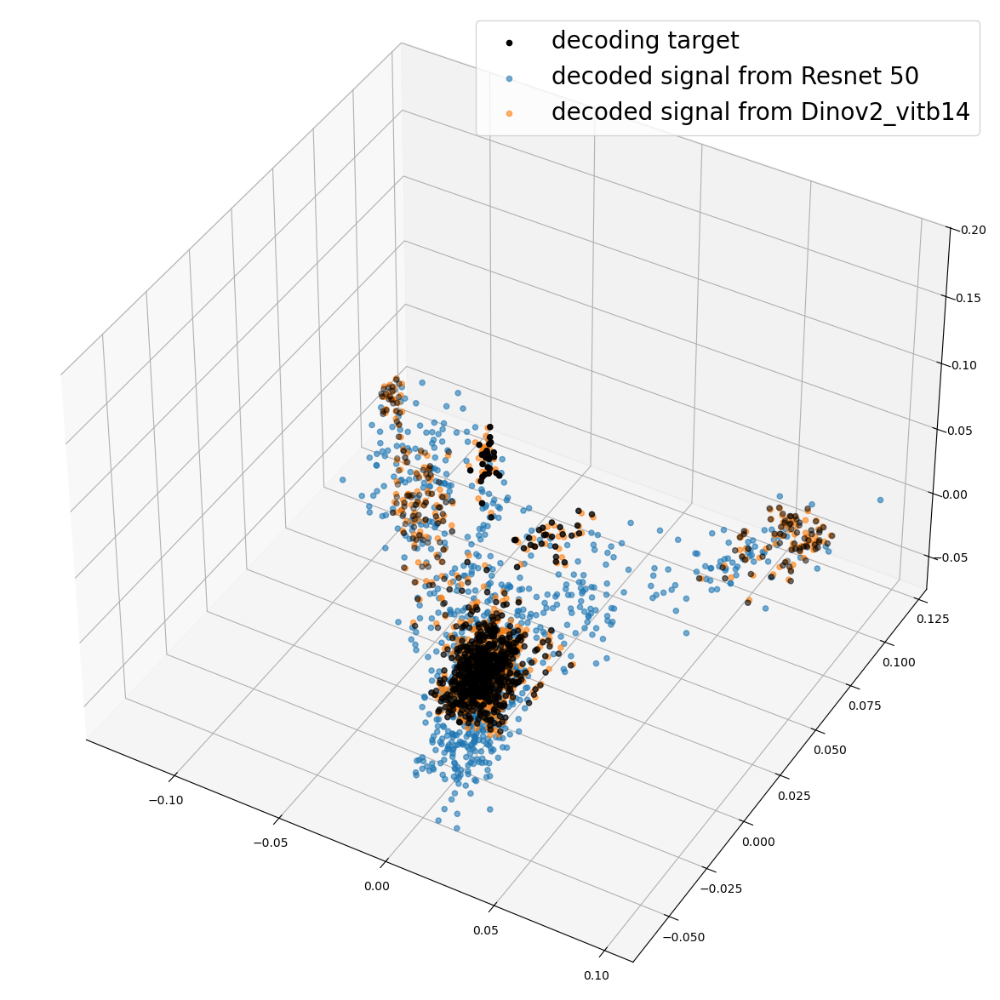

In [33]:
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

def getImage(path, zoom=1):
    return OffsetImage(plt.imread(path), zoom=zoom)



# images = [test_image_data[i,:,:,:] for i in range(1000)]
images = [shared_images[i] for i in range(len(shared_images))]


x = vecs[:,0].real
y = vecs[:,1].real
z = vecs[:,2].real

x1 = KX@vecs[:,0].real /np.linalg.norm(KX@vecs[:,0]) .real
y1 = KX@vecs[:,1].real /np.linalg.norm(KX@vecs[:,1]).real
z1 = KX@vecs[:,2].real /np.linalg.norm(KX@vecs[:,2]).real

x2 = KY@vecs[:,0].real/np.linalg.norm(KY@vecs[:,0]).real
y2 = KY@vecs[:,1].real/np.linalg.norm(KY@vecs[:,1]).real
z2 = KY@vecs[:,2].real/np.linalg.norm(KY@vecs[:,2]).real

# x = KX@Cz_1
# y = KY@Cz_1

colors = ["#1f77b4", "#ff7f0e", "#2ca02c"]

fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, z, color='k', label='decoding target') 
ax.scatter(x1, y1, z1, color=colors[0], alpha=0.6, label = 'decoded signal from Resnet 50')
ax.scatter(x2, y2, z2, color=colors[1], alpha=0.6, label = 'decoded signal from Dinov2_vitb14')
# # Connect corresponding points in (x, y) and (x1, y1)
# for xi, yi, xi1, yi1 in zip(x, y, x1, y1):
#     ax.plot([xi, xi1], [yi, yi1], color='gray', linewidth=1, alpha=0.7)
# # Connect corresponding points in (x, y) and (x2, y2)
# for xi, yi, xi2, yi2 in zip(x, y, x2, y2):
#     ax.plot([xi, xi2], [yi, yi2], color='gray', linewidth=1, alpha=0.5)
# ax.set_xlim(-0.3, 0.6)
# ax.set_ylim(-0.25, 0.75)

axes = plt.gca()
x_min, x_max = axes.get_xlim()
y_min, y_max = axes.get_ylim()

ax.view_init(elev=40, azim=-60) # Elevation and Azimuth angles

# # Determine the range for the unity line to cover the visible area
# # Ensure the line extends across the relevant portion of the plot
# unity_line_min = max(x_min, y_min)
# unity_line_max = min(x_max, y_max)

# # 
# or the unity line
# unity_x = np.linspace(unity_line_min, unity_line_max, 2)
# unity_y = unity_x

# # Plot the unity line
# plt.plot(unity_x, unity_y, color='red', linestyle='--', label='Unity Line (y=x)')
plt.legend(fontsize=20)

# plt.savefig('../maxmin_image_tiles/Scatter_projection3d_'+ metric_type +'_' + task  +'_a0b1_'+ model_names[0] + '_' + layer_names[ind1] + '_' + model_names[2] + '_' + layer_names[ind2] + '_algonauts_shared_images.pdf', dpi=500)
# 
    

In [34]:
(vecs[:,0].T @ KX @vecs[:,0] + vecs[:,1].T @ KX @vecs[:,1] +vecs[:,2].T @ KX @vecs[:,2]) /np.linalg.trace(KX)

np.float32(0.041147493)

In [35]:
(vecs[:,0].T @ KY @vecs[:,0] + vecs[:,1].T @ KY @vecs[:,1] + vecs[:,2].T @ KY @vecs[:,1]) /np.linalg.trace(KY)

np.float32(0.0800415)

In [36]:
np.linalg.trace(vecs[:,:40].T @ KX @vecs[:,:40]) / np.linalg.trace(KX)

np.float32(0.18845575)

In [37]:
var_explained_KX = [np.linalg.trace(vecs[:,:i].T @ KX @vecs[:,:i]) / np.linalg.trace(KX) for i in range(len(KX))]

In [38]:
var_explained_KY = [np.linalg.trace(vecs[:,:i].T @ KY @vecs[:,:i]) / np.linalg.trace(KY) for i in range(len(KY))]

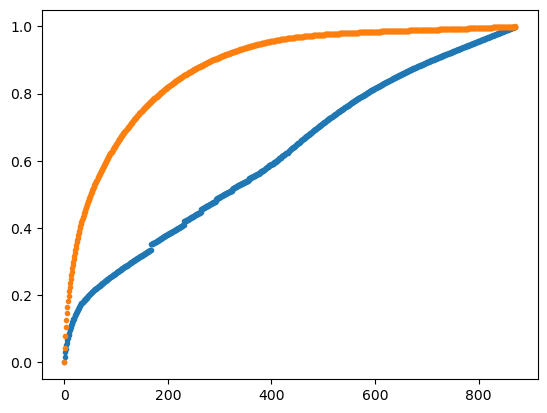

In [39]:
plt.plot(var_explained_KX,'.')
plt.plot(var_explained_KY,'.')

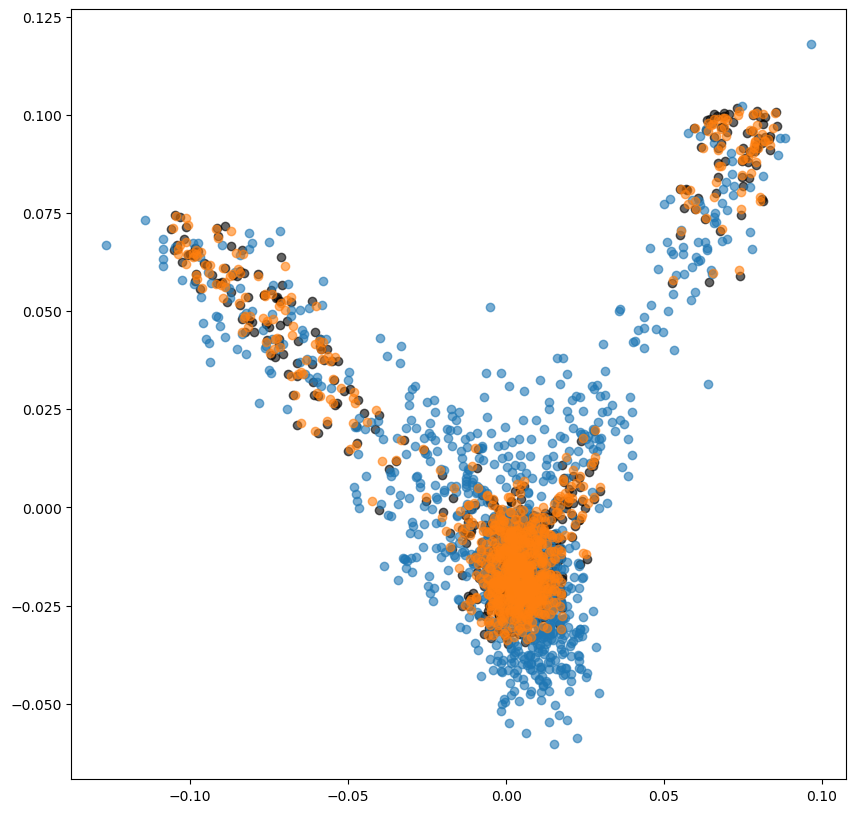

In [40]:
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

def getImage(path, zoom=1):
    return OffsetImage(plt.imread(path), zoom=zoom)



# images = [test_image_data[i,:,:,:] for i in range(1000)]
images = [shared_images[i] for i in range(len(shared_images))]


x = vecs[:,0]
y = vecs[:,1]

x1 = KX@vecs[:,0]/np.linalg.norm(KX@vecs[:,0])
y1 = KX@vecs[:,1]/np.linalg.norm(KX@vecs[:,1])

x2 = KY@vecs[:,0]/np.linalg.norm(KY@vecs[:,0])
y2 = KY@vecs[:,1]/np.linalg.norm(KY@vecs[:,1])

# x = KX@Cz_1
# y = KY@Cz_1

colors = ["#1f77b4", "#ff7f0e", "#2ca02c"]

fig, ax = plt.subplots(figsize=(10,10))
ax.scatter(x, y, color='k', alpha=0.6) 
ax.scatter(x1, y1, color=colors[0], alpha=0.6)
ax.scatter(x2, y2, color=colors[1],alpha=0.6)
# # Connect corresponding points in (x, y) and (x1, y1)
# for xi, yi, xi1, yi1 in zip(x, y, x1, y1):
#     ax.plot([xi, xi1], [yi, yi1], color='gray', linewidth=1, alpha=0.7)
# # Connect corresponding points in (x, y) and (x2, y2)
# for xi, yi, xi2, yi2 in zip(x, y, x2, y2):
#     ax.plot([xi, xi2], [yi, yi2], color='gray', linewidth=1, alpha=0.5)
# ax.set_xlim(-0.3, 0.6)
# ax.set_ylim(-0.25, 0.75)

axes = plt.gca()
x_min, x_max = axes.get_xlim()
y_min, y_max = axes.get_ylim()

# # Determine the range for the unity line to cover the visible area
# # Ensure the line extends across the relevant portion of the plot
# unity_line_min = max(x_min, y_min)
# unity_line_max = min(x_max, y_max)

# # 
# or the unity line
# unity_x = np.linspace(unity_line_min, unity_line_max, 2)
# unity_y = unity_x

# # Plot the unity line
# plt.plot(unity_x, unity_y, color='red', linestyle='--', label='Unity Line (y=x)')


# plt.savefig('../maxmin_image_tiles/Scattler_projection2d_'+ metric_type +'_' + task  +'_a0b1_'+ model_names[0] + '_' + layer_names[ind1] + '_' + model_names[2] + '_' + layer_names[ind2] + '_algonauts_shared_images.pdf', dpi=500)
# 
    

In [41]:
print(x1.T @ x)
print(y1.T @ y)


0.88530636
0.82270813


In [42]:
print(x2.T @ x)
print(y2.T @ y)

0.99975646
0.99957883


In [43]:
print(x1.T @ x2)
print(y1.T @ y2)

0.8953539
0.8388575


## Compare with NSD dataset

In [44]:
# Append some brain data to the list of representations


# areas = ['lh_FFA-1', 'rh_FFA-1', 'lh_FFA-2', 'rh_FFA-2']
# areas = ['lh_all-faces', 'rh_all-faces']
# areas = ['lh_all-words', 'rh_all-words']
# areas = ["lh_V1v", "rh_V1v", "lh_V1d", "rh_V1d"]
# areas = ['lh_OWFA', 'rh_OWFA']
# areas_both_hemi = ["OFA", "FFA-1", "FFA-2", "mTL-faces", "aTL-faces"] 

all_areas = ["V1v", "V1d", "V2v", "V2d", "V3v", "V3d", "hV4", "EBA", "FBA-1", "FBA-2", "mTL-bodies", "OFA", "FFA-1", "FFA-2", "mTL-faces", "aTL-faces", "OPA", "PPA", "RSC", "OWFA", "VWFA-1", "VWFA-2", "mfs-words", "mTL-words", "early", "midventral", "midlateral", "midparietal", "ventral", "lateral", "parietal", "all-prf-visual"]

hemisphere = "lh"  # lh, rh, or both
areas_to_append = all_areas #["FFA-2"] 
fuse = True


areas = []
for area in areas_to_append:
    if hemisphere == "both":
        areas.append('lh_' + area)
        areas.append('rh_' + area)
    elif hemisphere == "lh":
        areas.append('lh_' + area)
    elif hemisphere == "rh":
        areas.append('rh_' + area)

# all_areas = ["V1v", "V1d", "V2v", "V2d", "V3v", "V3d", "hV4", "EBA", "FBA-1", "FBA-2", "mTL-bodies", "OFA", "FFA-1", "FFA-2", "mTL-faces", "aTL-faces", "OPA", "PPA", "RSC", "OWFA", "VWFA-1", "VWFA-2", "mfs-words", "mTL-words", "early", "midventral", "midlateral", "midparietal", "ventral", "lateral", "parietal", "all-prf-visual", "all-bodies", "all-faces", "all-places", "all-words", "all-streams"]
# areas = @param all_areas {allow-input: true}

NSD_internal_reps = []
layer_names_NSD = []

for subjind in range(len(brainData)):
    for area in areas:
        if brainData[subjind][area].shape[1] == 0:
            continue
        # internal_reps.append(brainData[subjind][area]/np.linalg.norm(brainData[subjind][area], ord=2))
        NSD_internal_reps.append(brainData[subjind][area]/np.linalg.norm(brainData[subjind][area], ord=2))

        layer_names_NSD.append("Subject_" + str(subjind) + '_' + area)
        # layer_models.append("Subject_" + str(subjind))




In [479]:
import pickle

with open('../cached_matrices/internal_reps_cache_all_subjects_all_areas_algonauts_shared_a0b1_all_layers_colors_normal_opnorm.pkl', 'wb') as fp:
    pickle.dump(NSD_internal_reps, fp)

In [289]:
import pickle

with open ('../cached_matrices/internal_reps_cache_all_subjects_all_areas_algonauts_shared_a0b1_all_layers_colors_normal_opnorm.pkl', 'rb') as fp:
    NSD_internal_reps = pickle.load(fp)

In [324]:
# Load some saved representations

repDict_final = {}

model_names = ["alexnet",'efficientnet_b0', 'resnet152','swin_v2_b']

N_models = len(model_names)
for model_name in model_names:
    with open('../reps/' + model_name + '_algonauts_shared_images.pkl', 'rb') as f:
        new_reps = pickle.load(f)
        last_key = list(new_reps[model_name])[-2]
        last_value = new_reps[model_name][last_key]
        repDict_final.update({model_name: last_value})
        print(model_name)

# model_names, _ = zip(*repDict.items())
layer_names_last = [value for value in repDict_final.keys()]
# internal_reps = [value[0] for value in repDict.values()]


alexnet
efficientnet_b0
resnet152
swin_v2_b


In [341]:
layer_names_final = []
internal_reps_final = []
layer_models_final = []

for model_name in model_names:
    internal_reps_final.append(repDict_final[model_name])
    # layer_models_final.extend([model_name] * len([value for value in repDict_final[model_name].keys()]))


In [ ]:
layer_names = []
internal_reps = []
layer_models = []

for model_name in model_names:
    layer_names.extend([value for value in repDict_cnormal[model_name].keys()])
    internal_reps.extend([value for value in repDict_cnormal[model_name].values()])
    layer_models.extend([model_name] * len([value for value in repDict_cnormal[model_name].keys()]))


In [342]:
# Make sure representations are flattened

internal_reps_final = [internal_reps_final[i].reshape((internal_reps_final[i].shape[0], np.prod(list(internal_reps_final[i].shape[1:])) )) for i in range(len(internal_reps_final))]

internal_reps_final = [internal_rep/np.linalg.norm(internal_rep, ord=2) for internal_rep in internal_reps_final]

[internal_rep.shape for internal_rep in internal_reps_final]


[(872, 9216), (872, 1280), (872, 2048), (872, 1024)]

In [343]:
# Make sure representations are flattened

internal_reps = [internal_reps[i].reshape((internal_reps[i].shape[0], np.prod(list(internal_reps[i].shape[1:])) )) for i in range(len(internal_reps))]

[internal_rep.shape for internal_rep in internal_reps]


[(872, 150528),
 (872, 802816),
 (872, 802816),
 (872, 802816),
 (872, 200704),
 (872, 802816),
 (872, 401408),
 (872, 200704),
 (872, 100352),
 (872, 2048),
 (872, 1000),
 (872, 150528),
 (872, 150528),
 (872, 151296),
 (872, 151296),
 (872, 151296),
 (872, 151296),
 (872, 151296),
 (872, 151296),
 (872, 151296),
 (872, 151296),
 (872, 151296),
 (872, 151296),
 (872, 151296),
 (872, 151296),
 (872, 151296),
 (872, 1000),
 (872, 150528),
 (872, 196608),
 (872, 197376),
 (872, 197376),
 (872, 197376),
 (872, 197376),
 (872, 197376),
 (872, 197376),
 (872, 197376),
 (872, 197376),
 (872, 197376),
 (872, 197376),
 (872, 197376),
 (872, 197376),
 (872, 197376),
 (872, 768)]

In [89]:
import metrics 

dd = metrics.LinearDecodingSimilarityMulti(center_columns=True, a = 0, b = 1, whiten = False, alpha = 0.5)
cached = dd.cache(NSD_internal_reps, returnGinv=False) # this part takes a long time
# cached = dd.cache(reps_pcs, returnGinv=False) # this part takes a long time
np.savez('../cached_matrices/Kx_cache_resnet50_NSD_all_areas_algonauts_shared_a0b1_all_layers_colors_normal_opnorm.npz', cached, layer_names_NSD)




0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
Done caching.


In [457]:
import metrics 

dd = metrics.LinearDecodingSimilarityMulti(center_columns=True, a = 0, b = 1, whiten = False, alpha = 0.5)
cached_final = dd.cache(internal_reps_final, returnGinv=False) # this part takes a long time
# cached = dd.cache(reps_pcs, returnGinv=False) # this part takes a long time
np.savez('../cached_matrices/Kx_cache_FINAL_ADDED_algonauts_shared_a0b1_colors_normal_opnorm.npz', cached_final, layer_names_final)




0
1
2
3
Done caching.


In [15]:
import metrics 

dd = metrics.LinearDecodingSimilarityMulti(center_columns=True, a = 0, b = 1, whiten = False, alpha = 0.5)
cached = dd.cache(internal_reps, returnGinv=False) # this part takes a long time
# cached = dd.cache(reps_pcs, returnGinv=False) # this part takes a long time
np.savez('../cached_matrices/Kx_cache_resnet50_vit_b_16_DINOv2_vitb14_lh-hV4_algonauts_shared_a0b1_all_layers_colors_normal_opnorm.npz', cached, layer_names)




0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
Done caching.


In [291]:
# load previously computed cache

loaded_cache = np.load('../cached_matrices/Kx_cache_resnet50_NSD_all_areas_algonauts_shared_a0b1_all_layers_colors_normal_opnorm.npz')

# cached = loaded_cache
cachedNSD = loaded_cache["arr_0"]
layer_names_NSD = loaded_cache["arr_1"]
layer_names_NSD = [str(layer_name_NSD) for layer_name_NSD in layer_names_NSD]

In [292]:
# load previously computed cache

loaded_cache = np.load('../cached_matrices/Kx_cache_resnet50_vit_b_16_DINOv2_vitb14_lh-hV4_algonauts_shared_a0b1_all_layers_colors_normal_opnorm.npz')

# cached = loaded_cache
cached = loaded_cache["arr_0"]
layer_names = loaded_cache["arr_1"]
layer_names = [str(layer_name) for layer_name in layer_names]

In [458]:
# load previously computed cache

loaded_cache = np.load('../cached_matrices/Kx_cache_FINAL_ADDED_algonauts_shared_a0b1_colors_normal_opnorm.npz')

# cached = loaded_cache
cached_final = loaded_cache["arr_0"]
layer_names_final = loaded_cache["arr_1"]
layer_names_final = [str(layer_name) for layer_name in layer_names_final]

In [347]:
layer_names_NSD.index('Subject_0_lh_all-prf-visual')

25

In [348]:
layer_names

['pixels',
 'conv1',
 'bn1',
 'relu',
 'maxpool',
 'layer1',
 'layer2',
 'layer3',
 'layer4',
 'avgpool',
 'fc',
 'pixels',
 'conv_proj',
 'encoder_layer_0',
 'encoder_layer_1',
 'encoder_layer_2',
 'encoder_layer_3',
 'encoder_layer_4',
 'encoder_layer_5',
 'encoder_layer_6',
 'encoder_layer_7',
 'encoder_layer_8',
 'encoder_layer_9',
 'encoder_layer_10',
 'encoder_layer_11',
 'encoder',
 'heads',
 'pixels',
 'patch_embed',
 'block.0',
 'block.1',
 'block.2',
 'block.3',
 'block.4',
 'block.5',
 'block.6',
 'block.7',
 'block.8',
 'block.9',
 'block.10',
 'block.11',
 'norm',
 'head',
 'Subject_0_lh_hV4',
 'Subject_1_lh_hV4',
 'Subject_2_lh_hV4',
 'Subject_3_lh_hV4',
 'Subject_4_lh_hV4',
 'Subject_5_lh_hV4',
 'Subject_6_lh_hV4',
 'Subject_7_lh_hV4']

In [447]:
len(cached_final)

51

In [472]:
ind1 = 8 #2 #13
ind2 = -9 #-9 #43 #35 #20 #30

ind3 = 3 #25

metric_type = 'similarity'
# metric_type = 'distance'
# task = 'random'
task = 'max'

KX = cached[ind1]
KY = cached[ind2]
Kbrain = cached_final[ind3]

# KX = cached[ind1]/np.linalg.norm(cached[ind1], ord='fro')
# KY = cached[ind2]/np.linalg.norm(cached[ind2], ord='fro')

if metric_type == 'similarity':
    A = (1/2)*(KX@KY + KY@KX)
    # A = (1/2)*(C.T @ KX@KY @ C + C.T @ KY@KX @ C)
elif metric_type == 'distance':
    # A = C.T @ (KX - KY)@(KX - KY) @ C
    A = (KX - KY)@(KX - KY)
else:
    print('check metric type')

# A = (1/2)*(KY@KY - KY + KX - KX@KY)@(KY@KY - KY + KX - KY@KX)

if task == 'random':
    # z = np.random.rand(KX.shape[0],3)
    z = np.random.standard_normal(size=(KX.shape[0],50))
    vecs = z
else:
    vals, vecs = np.linalg.eig(A)

    idx = vals.argsort()[::-1]   
    vals = vals[idx]
    vecs = vecs[:,idx]

print(layer_names[ind1])
print(layer_names[ind2])
print(layer_names[ind3])
# print(layer_names_NSD[ind3])


print(vecs[:,0].T @ A @ vecs[:,0])
print(vecs[:,0].T @ KX@KY @ vecs[:,0])
print(vecs[:,0].T @ Kbrain@Kbrain @ vecs[:,0])

layer4
head
relu
5.3344138e-08
5.3344138e-08
2.7459492e-07


In [473]:
model_names

['alexnet', 'efficientnet_b0', 'resnet152', 'swin_v2_b']

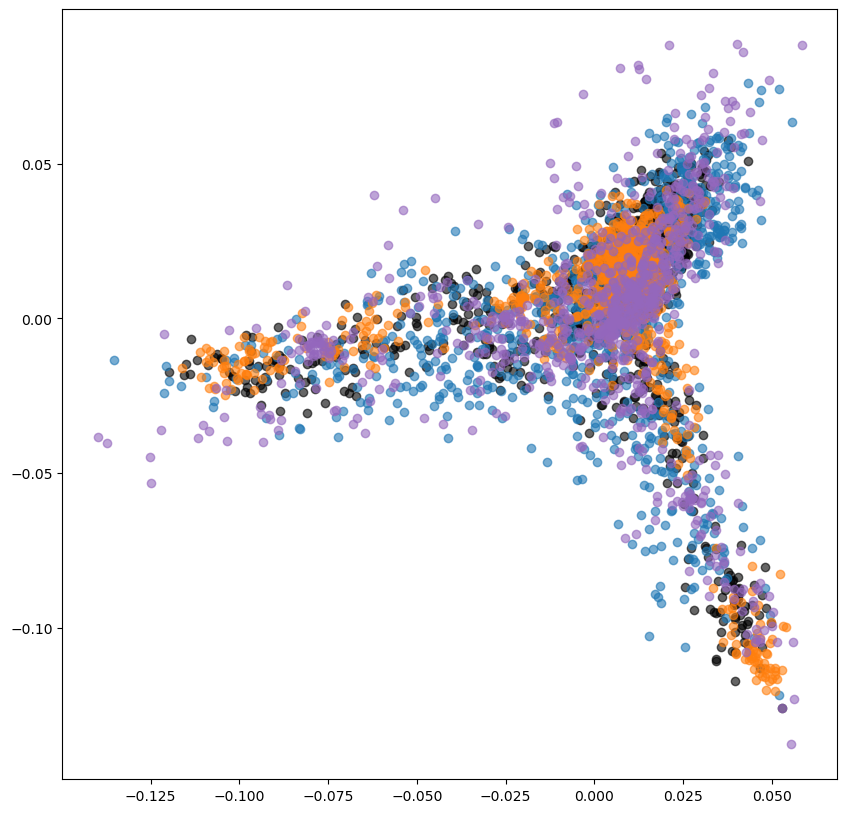

In [478]:
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

def getImage(path, zoom=1):
    return OffsetImage(plt.imread(path), zoom=zoom)



# images = [test_image_data[i,:,:,:] for i in range(1000)]
images = [shared_images[i] for i in range(len(shared_images))]


x = vecs[:,0]/np.linalg.norm(vecs[:,0])
y = vecs[:,1]/np.linalg.norm(vecs[:,1])

x1 = KX@vecs[:,0]/np.linalg.norm(KX@vecs[:,0])
y1 = KX@vecs[:,1]/np.linalg.norm(KX@vecs[:,1])

x2 = KY@vecs[:,0]/np.linalg.norm(KY@vecs[:,0])
y2 = KY@vecs[:,1]/np.linalg.norm(KY@vecs[:,1])

x3 = Kbrain@vecs[:,0]/np.linalg.norm(Kbrain@vecs[:,0])
y3 = Kbrain@vecs[:,1]/np.linalg.norm(Kbrain@vecs[:,1])

# x = KX@Cz_1
# y = KY@Cz_1

colors = ["#1f77b4", "#ff7f0e", "#2ca02c", "#d62728", "#9467bd"]


fig, ax = plt.subplots(figsize=(10,10))
ax.scatter(x, y, color='k', alpha=0.6) 
ax.scatter(x1, y1, color=colors[0], alpha=0.6)
ax.scatter(x2, y2, color=colors[1],alpha=0.6)
ax.scatter(x3, y3, color=colors[4],alpha=0.6)

# # Connect corresponding points in (x, y) and (x1, y1)
# for xi, yi, xi1, yi1 in zip(x, y, x1, y1):
#     ax.plot([xi, xi1], [yi, yi1], color='gray', linewidth=1, alpha=0.7)
# # Connect corresponding points in (x, y) and (x2, y2)
# for xi, yi, xi2, yi2 in zip(x, y, x2, y2):
#     ax.plot([xi, xi2], [yi, yi2], color='gray', linewidth=1, alpha=0.5)
# ax.set_xlim(-0.3, 0.6)
# ax.set_ylim(-0.25, 0.75)

axes = plt.gca()
x_min, x_max = axes.get_xlim()
y_min, y_max = axes.get_ylim()


# # Determine the range for the unity line to cover the visible area
# # Ensure the line extends across the relevant portion of the plot
# unity_line_min = max(x_min, y_min)
# unity_line_max = min(x_max, y_max)

# # 
# or the unity line
# unity_x = np.linspace(unity_line_min, unity_line_max, 2)
# unity_y = unity_x

# # Plot the unity line
# plt.plot(unity_x, unity_y, color='red', linestyle='--', label='Unity Line (y=x)')


plt.savefig('../maxmin_image_tiles/projection2d_'+ metric_type +'_' + task  +'_a0b1_' + 'models_with_unseen_DNN_algonauts_shared_images.pdf', dpi=500)
# 
    

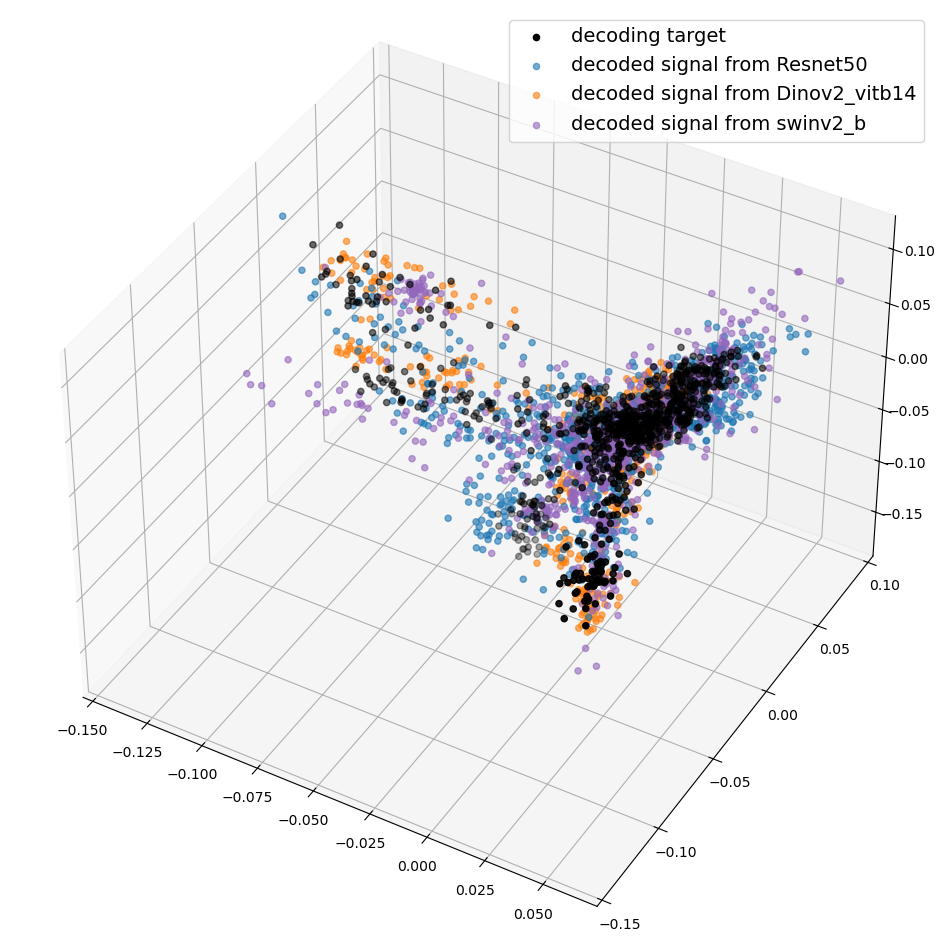

In [477]:
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

def getImage(path, zoom=1):
    return OffsetImage(plt.imread(path), zoom=zoom)



# images = [test_image_data[i,:,:,:] for i in range(1000)]
images = [shared_images[i] for i in range(len(shared_images))]


x = vecs[:,0].real
y = vecs[:,1].real
z = vecs[:,2].real

x1 = KX@vecs[:,0].real /np.linalg.norm(KX@vecs[:,0]) .real
y1 = KX@vecs[:,1].real /np.linalg.norm(KX@vecs[:,1]).real
z1 = KX@vecs[:,2].real /np.linalg.norm(KX@vecs[:,2]).real

x2 = KY@vecs[:,0].real/np.linalg.norm(KY@vecs[:,0]).real
y2 = KY@vecs[:,1].real/np.linalg.norm(KY@vecs[:,1]).real
z2 = KY@vecs[:,2].real/np.linalg.norm(KY@vecs[:,2]).real

x3 = Kbrain@vecs[:,0]/np.linalg.norm(Kbrain@vecs[:,0])
y3 = Kbrain@vecs[:,1]/np.linalg.norm(Kbrain@vecs[:,1])
z3 = Kbrain@vecs[:,2]/np.linalg.norm(Kbrain@vecs[:,2])


# x = KX@Cz_1
# y = KY@Cz_1

fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, z, color='k',label='decoding target') 
ax.scatter(x1, y1, z1, color=colors[0], alpha=0.6,label = 'decoded signal from Resnet50')
ax.scatter(x2, y2, z2, color=colors[1],alpha=0.6,label = 'decoded signal from Dinov2_vitb14')
ax.scatter(x3, y3, z3, color=colors[4],alpha=0.6,label = 'decoded signal from swinv2_b')

# # Connect corresponding points in (x, y) and (x1, y1)
# for xi, yi, xi1, yi1 in zip(x, y, x1, y1):
#     ax.plot([xi, xi1], [yi, yi1], color='gray', linewidth=1, alpha=0.7)
# # Connect corresponding points in (x, y) and (x2, y2)
# for xi, yi, xi2, yi2 in zip(x, y, x2, y2):
#     ax.plot([xi, xi2], [yi, yi2], color='gray', linewidth=1, alpha=0.5)
# ax.set_xlim(-0.3, 0.6)
# ax.set_ylim(-0.25, 0.75)

axes = plt.gca()
x_min, x_max = axes.get_xlim()
y_min, y_max = axes.get_ylim()

ax.view_init(elev=40, azim=-60) # Elevation and Azimuth angles


# # Determine the range for the unity line to cover the visible area
# # Ensure the line extends across the relevant portion of the plot
# unity_line_min = max(x_min, y_min)
# unity_line_max = min(x_max, y_max)

# # 
# or the unity line
# unity_x = np.linspace(unity_line_min, unity_line_max, 2)
# unity_y = unity_x

# # Plot the unity line
# plt.plot(unity_x, unity_y, color='red', linestyle='--', label='Unity Line (y=x)')


plt.legend(fontsize=14)
plt.savefig('../maxmin_image_tiles/projection3d_'+ metric_type +'_' + task  +'_a0b1_'+'models_with_unseen_DNN_algonauts_shared_images.pdf', dpi=500)
# 
    

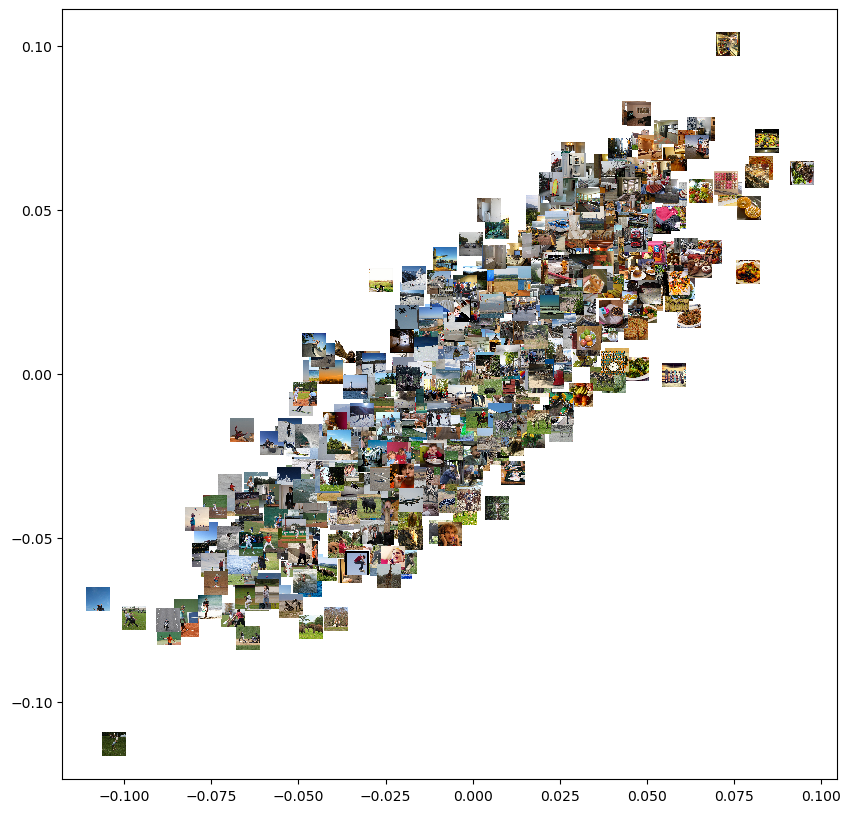

In [440]:
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

def getImage(path, zoom=1):
    return OffsetImage(plt.imread(path), zoom=zoom)



# images = [test_image_data[i,:,:,:] for i in range(1000)]
images = [shared_images[i] for i in range(len(shared_images))]

vecind = 0

x = Kbrain@vecs[:,vecind]/np.linalg.norm(Kbrain@vecs[:,vecind])
y = Kbrain@vecs[:,vecind+1]/np.linalg.norm(Kbrain@vecs[:,vecind+1])

# x = KX@vecs[:,vecind]/np.linalg.norm(KX@vecs[:,vecind])
# y = KX@vecs[:,vecind+1]/np.linalg.norm(KX@vecs[:,vecind+1])

# x = KX@vecs[:,vecind]
# y = KY@vecs[:,vecind]

# x = vecs[:,0]
# y = vecs[:,1]

# x = KX@Cz_1
# y = KY@Cz_1

fig, ax = plt.subplots(figsize=(10,10))
ax.scatter(x, y) 
# ax.set_xlim(-0.3, 0.6)
# ax.set_ylim(-0.25, 0.75)

axes = plt.gca()
x_min, x_max = axes.get_xlim()
y_min, y_max = axes.get_ylim()

# # Determine the range for the unity line to cover the visible area
# # Ensure the line extends across the relevant portion of the plot
# unity_line_min = max(x_min, y_min)
# unity_line_max = min(x_max, y_max)

# # Create x and y values for the unity line
# unity_x = np.linspace(unity_line_min, unity_line_max, 2)
# unity_y = unity_x

# # Plot the unity line
# plt.plot(unity_x, unity_y, color='red', linestyle='--', label='Unity Line (y=x)')


zoom=0.04

for x0, y0, imgdata in zip(x, y,images):
    img = OffsetImage(imgdata, zoom=zoom)
    # img = Image.fromarray(imgdata, 'RGB')
    ab = AnnotationBbox(img, (x0, y0), frameon=False)
    ax.add_artist(ab)
# 
# plt.savefig('../maxmin_image_tiles/zxzy_'+ metric_type +'_' + task + '_a0b1_'+ model_names[0] + '_' + layer_names[ind1] + '_' + model_names[1] + '_' + layer_names[ind2] + '_algonauts_shared_images_1.pdf', dpi=500)
# 
    

In [236]:
def flatten_reps(internal_reps):
    internal_reps = [internal_rep.reshape((internal_rep.shape[0], np.prod(list(internal_rep.shape[1:])) )) for internal_rep in internal_reps]
    return internal_reps

In [500]:
# Make Cz 
p = 2
Cz = (1/p) * vecs[:,0:p] @ vecs[:,0:p].T

In [509]:
def eigensim(KX,KY, vecs, p):
    sim = 0
    for i in range(p):
        sim = sim + (1/p) * (vecs[:,i].T @ KX @ KY @ vecs[:,i])/(np.linalg.norm(KX@vecs[:,i]) * np.linalg.norm(KY@vecs[:,i]))
    return sim

In [511]:
def eigensim(KX,KY, vecs, p):
    sim = np.linalg.trace(vecs[:,:p].T @ KX @ KY @ vecs[:,:p]) / (np.linalg.norm(KX @ vecs[:,:p], ord = 'fro') * np.linalg.norm(KY @ vecs[:,:p], ord = 'fro'))
    return sim

In [512]:
eigensim(KX,KY, vecs, 5)

np.float32(0.80784583)

In [359]:
import metrics

dd = metrics.LinearDecodingSimilarityMulti(center_columns=True, a = 0, b = 1, whiten = False, alpha = 0.5)


In [366]:
model_names

['alexnet', 'efficientnet_b0', 'resnet152', 'swin_v2_b']

In [420]:
layer_names_to_use = []
# layer_names_to_use.append(layer_names[ind1])
layer_names_to_use.append('Resnet50')
# layer_names_to_use.append(layer_names[ind2])
layer_names_to_use.append('Dinov2')
layer_names_to_use.extend(model_names)

# layer_names_to_use.append(layer_names[ind3])
layer_names_to_use.extend(layer_names_NSD[31*0:31*1])

In [421]:
layer_names_to_use

['Resnet50',
 'Dinov2',
 'alexnet',
 'efficientnet_b0',
 'resnet152',
 'swin_v2_b',
 'Subject_0_lh_V1v',
 'Subject_0_lh_V1d',
 'Subject_0_lh_V2v',
 'Subject_0_lh_V2d',
 'Subject_0_lh_V3v',
 'Subject_0_lh_V3d',
 'Subject_0_lh_hV4',
 'Subject_0_lh_EBA',
 'Subject_0_lh_FBA-1',
 'Subject_0_lh_OFA',
 'Subject_0_lh_FFA-1',
 'Subject_0_lh_OPA',
 'Subject_0_lh_PPA',
 'Subject_0_lh_RSC',
 'Subject_0_lh_OWFA',
 'Subject_0_lh_VWFA-1',
 'Subject_0_lh_VWFA-2',
 'Subject_0_lh_mfs-words',
 'Subject_0_lh_early',
 'Subject_0_lh_midventral',
 'Subject_0_lh_midlateral',
 'Subject_0_lh_midparietal',
 'Subject_0_lh_ventral',
 'Subject_0_lh_lateral',
 'Subject_0_lh_parietal',
 'Subject_0_lh_all-prf-visual',
 'Subject_0_lh_all-bodies',
 'Subject_0_lh_all-faces',
 'Subject_0_lh_all-places',
 'Subject_0_lh_all-words',
 'Subject_0_lh_all-streams']

In [425]:
internal_reps_final[2]

array([[1.56400504e-03, 8.06325523e-04, 9.62465943e-04, ...,
        8.75108060e-04, 8.17752443e-04, 4.13567876e-04],
       [8.71566474e-04, 1.79061622e-04, 3.36616969e-04, ...,
        5.23993862e-04, 5.09147474e-04, 8.82213702e-04],
       [4.89597395e-03, 4.72417567e-04, 1.04801584e-04, ...,
        6.59130092e-05, 7.78836489e-04, 1.31390014e-04],
       ...,
       [1.32299820e-03, 6.83907769e-04, 5.61746652e-04, ...,
        5.82931505e-04, 1.02369918e-03, 1.85336953e-03],
       [2.59665074e-03, 1.01780542e-03, 6.82498328e-04, ...,
        3.93215771e-04, 8.60377550e-05, 8.12504441e-04],
       [7.34618574e-04, 6.87104184e-05, 4.61807824e-04, ...,
        2.17040488e-03, 4.85435477e-04, 2.50445359e-04]],
      shape=(872, 2048), dtype=float32)

In [513]:
internal_reps_to_use = []
internal_reps_to_use.append(internal_reps[ind1])
internal_reps_to_use.append(internal_reps[ind2])
internal_reps_to_use.extend(internal_reps_final)
# internal_reps_to_use.append(internal_reps[ind3])
internal_reps_to_use.extend(NSD_internal_reps[31*0:31*1])

In [524]:
DSscores = np.zeros((len(internal_reps_to_use), len(internal_reps_to_use)))

dd = metrics.LinearDecodingSimilarityMulti(center_columns=True, a = 0, b = 1, whiten = False, alpha = 0.5)
cached_to_use = dd.cache(internal_reps_to_use, returnGinv=False) 

for i in range(len(DSscores)):
    for j in range(len(DSscores)):
        if i <= j:
            DSscores[i,j] = eigensim(cached_to_use[i],cached_to_use[j], vecs, 5)
    print(i)

DSscores = DSscores + DSscores.T

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
Done caching.
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36


In [48]:

# internal_reps_to_use = flatten_reps(internal_reps_to_use)

dd = metrics.LinearDecodingSimilarityMulti(center_columns=True, a = 0, b = 1, whiten = False, alpha = 0.5)
cached_to_use = dd.cache(internal_reps_to_use, returnGinv=False) 

cached_norm = np.zeros(np.shape(cached_to_use))
for i in range(np.shape(cached_to_use)[0]):
    cached_norm[i] = cached_to_use[i]/(np.sqrt(np.trace(cached_to_use[i]@cached_to_use[i]@Cz)))

# DSscores = dd.score(internal_reps_to_use,Cz,cached_to_use)
DSscores = dd.distance(internal_reps_to_use,Cz,cached_norm)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
Done caching.
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32


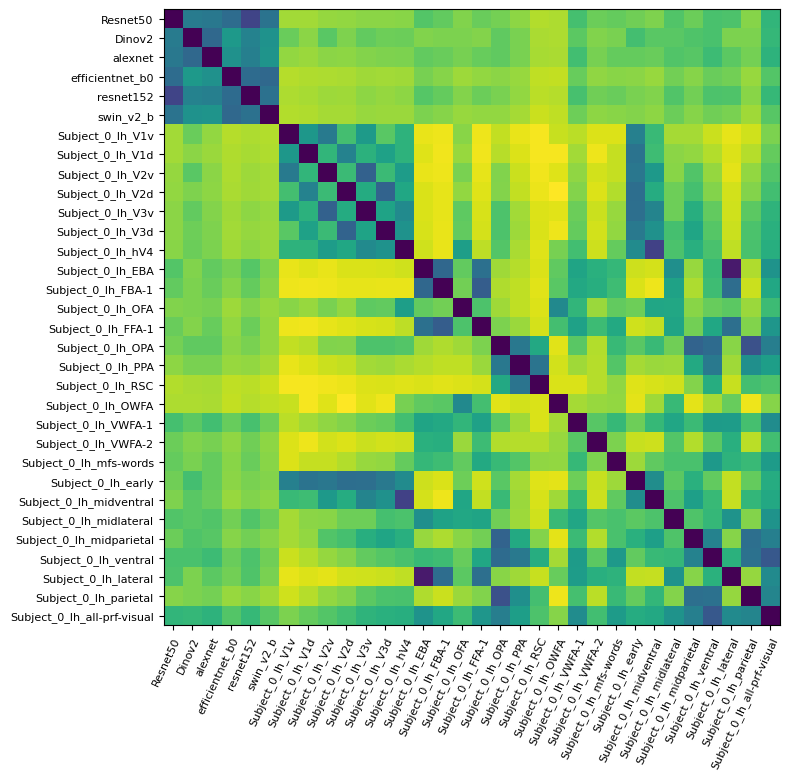

In [525]:
for i in range(len(DSscores)):
    DSscores[i,i] = 1

DSscores[DSscores >1] = 1

# Look at the distance matrix
dists_ds = np.arccos(DSscores[:-5,:-5])
# dist_ds = DSscores
# dists_ds = DSdists

# Create the heatmap
fig, ax = plt.subplots(figsize= (8,8))
im = ax.imshow(dists_ds)

# Define custom tick locations and labels
x_ticks = np.arange(dists_ds.shape[0])
x_labels = layer_names_to_use[:-5] # Custom labels

y_ticks = np.arange(dists_ds.shape[1])
y_labels = layer_names_to_use[:-5]

# Set x-axis ticks and labels
ax.set_xticks(x_ticks)
# ax.set_xticks([])
ax.set_xticklabels(x_labels)

# Set y-axis ticks and labels
ax.set_yticks(y_ticks)
# ax.set_yticks([])
ax.set_yticklabels(y_labels)

# Add a colorbar
# cbar = ax.figure.colorbar(im, ax=ax)

# Rotate the tick labels and set their alignment
# plt.setp(ax.get_xticklabels(), rotation=60, ha="right",
#          rotation_mode="anchor")

plt.setp(ax.get_xticklabels(),
         fontsize=8,
         rotation=65,
         ha='right', # horizontal alignment
         color='black', 
        rotation_mode="anchor")

plt.setp(ax.get_yticklabels(),
         fontsize=8,
         rotation=0,
         ha='right', # horizontal alignment
         color='black', 
        rotation_mode="anchor")

# Add title
# ax.set_title("Trained weights")

# plt.savefig('../maxmin_image_tiles/sim_mat_eigsim_resnet_dino_with_added_deep_nets.pdf',bbox_inches='tight')

# Display the plot
plt.show()

In [528]:
# ADS Embedding

from sklearn.manifold import MDS
from sklearn.decomposition import PCA

embedding = MDS(n_components=50, metric= True, eps = 0.00001, normalized_stress='auto', dissimilarity='precomputed')
Z = embedding.fit_transform(np.abs(np.real(dists_ds)))
print(embedding.stress_)

pca = PCA(n_components=3)
pcs1 = pca.fit_transform(Z)
np.sum(pca.explained_variance_ratio_)

0.015556001949397259


np.float64(0.5976328813107498)

/tmp/ipykernel_489574/777273433.py:23: UserWarning:

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.



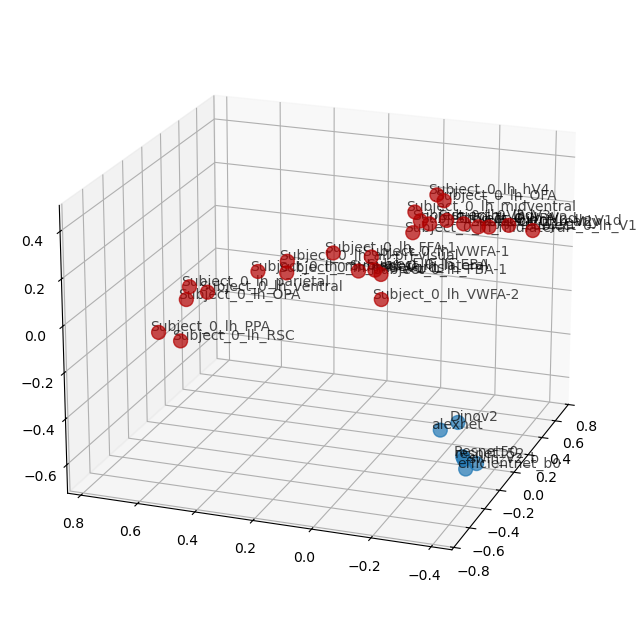

In [533]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
from matplotlib.animation import FuncAnimation

# Create the figure and axes object
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')

# Generate random 3D data for the scatter plot
num_points = len(pcs1)
x = pcs1[:6,0]
y = pcs1[:6,1]
z = pcs1[:6,2]

xh = pcs1[6:,0]
yh = pcs1[6:,1]
zh = pcs1[6:,2]

# Create the scatter plot
scatter1 = ax.scatter(x, y,z,s=100,alpha=0.7)
# scatter2 = ax.scatter(xr, yr, zr,s=100,c=[0,0.7,0],alpha=0.7)
scatter3 = ax.scatter(xh, yh,zh,s=100,c=[0.7,0,0],alpha=0.7)

for i, txt in enumerate(layer_names_to_use[:-5]):
    ax.text(pcs1[i,0], pcs1[i,1]+0.03,pcs1[i,2],txt,fontsize=10,alpha=0.7)

# ax.text(pcs1[-2,0], pcs1[-2,1]+0.02,pcs1[-2,2],"NSD human 1",fontsize=9, alpha=0.9)
# ax.text(pcs1[-1,0], pcs1[-1,1]+0.02,pcs1[-1,2],"NSD human 2",fontsize=9, alpha=0.9)


# for i, txt in enumerate(["Human 1", "Human 2"]):
#     ax.text(pcs1[i,0], pcs1[i,1],pcs1[i,2],txt,fontsize=10)

# Define the animation function
def rotate(angle):
    ax.view_init(azim=angle)
    return scatter,

ax.view_init(elev=20, azim=200) # Elevation and Azimuth angles


# # Create the animation
# num_frames = 360  # Number of frames for a full rotation
# animation = FuncAnimation(fig, rotate, frames=num_frames, interval=20, blit=False)

# # Save the animation as a video
# animation.save('ADS_rotating_scatter_plot_random_weights.mp4', writer='ffmpeg', fps=30, dpi=300)

# plt.savefig('../maxmin_image_tiles/ads_scatter_plot_aligned_resnet50_dino_with_subject0_added_deep_nets.pdf')

plt.show()

In [412]:
import plotly
import plotly.graph_objs as go

# Configure Plotly to be rendered inline in the notebook.
plotly.offline.init_notebook_mode()

Nlayers1 = 2
# Nlayers2 = len(repDict[model_names[1]])
Nhumans = 28

# Configure the trace.
trace1 = go.Scatter3d(
    x=pcs1[:Nlayers1,0],  # <-- Put your data instead
    y=pcs1[:Nlayers1,1],  # <-- Put your data instead
    z=pcs1[:Nlayers1,2],  # <-- Put your data instead
    mode='markers+text',
    marker={
        'size': 10,
        'opacity': 0.8
    }, text=layer_names_to_use[:Nlayers1]
)


# # Configure the trace.
# trace2 = go.Scatter3d(
#     x=pcs1[Nlayers1:Nlayers1+Nlayers2,0],  # <-- Put your data instead
#     y=pcs1[Nlayers1:Nlayers1+Nlayers2,1],  # <-- Put your data instead
#     z=pcs1[Nlayers1:Nlayers1+Nlayers2,2],  # <-- Put your data instead
#     mode='markers+text',
#     marker={
#         'size': 10,
#         'opacity': 0.8
#     }, text=layer_names[Nlayers1:Nlayers1+Nlayers2]
# )

# # Configure the trace.
# trace3 = go.Scatter3d(
#     x=pcs1[Nlayers1+Nlayers2:-Nhumans,0],  # <-- Put your data instead
#     y=pcs1[Nlayers1+Nlayers2:-Nhumans,1],  # <-- Put your data instead
#     z=pcs1[Nlayers1+Nlayers2:-Nhumans,2],  # <-- Put your data instead
#     mode='markers+text',
#     marker={
#         'size': 10,
#         'opacity': 0.8
#     }, text=layer_names[Nlayers1+Nlayers2:-Nhumans]
# )

# Configure the trace.
trace4 = go.Scatter3d(
    x=pcs1[2:,0],  # <-- Put your data instead
    y=pcs1[2:,1],  # <-- Put your data instead
    z=pcs1[2:,2],  # <-- Put your data instead
    mode='markers+text',
    marker={
        'size': 10,
        'opacity': 0.8
    }, text=layer_names_to_use[2:]
)

# Configure the layout.
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0}
)

# data = [trace1, trace2, trace3, trace4]
data = [trace1, trace4]


plot_figure = go.Figure(data=data, layout=layout)

# Render the plot.
plotly.offline.iplot(plot_figure)

In [497]:
pca = PCA(n_components=3)
pcs1 = pca.fit_transform(internal_reps_final[1])
np.sum(pca.explained_variance_ratio_)

np.float32(0.108190805)

In [498]:
pcs1

array([[ 0.01417247,  0.01118092,  0.00248489],
       [ 0.01975219,  0.01064467, -0.00023938],
       [ 0.00247518, -0.03794189,  0.00397356],
       ...,
       [-0.00299148,  0.02606848,  0.0388659 ],
       [ 0.02987641, -0.0140396 , -0.00355052],
       [ 0.02661855,  0.01781871, -0.0179772 ]],
      shape=(872, 3), dtype=float32)

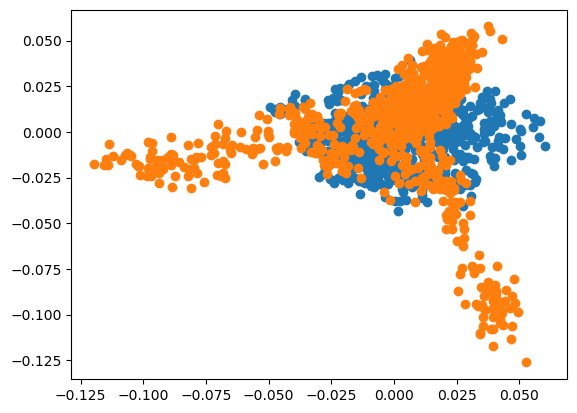

In [499]:
plt.scatter(pcs1[:,0], pcs1[:,1])
plt.scatter(x, y)